In [2]:
import pandas as pd
import os
from mlxtend.plotting import plot_decision_regions
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV 
import numpy as np
import warnings
import numpy as np
import time
warnings.filterwarnings('ignore')
%matplotlib inline 

In [3]:
os.getcwd()

'C:\\Users\\user\\Desktop\\JUPYTER PROJECTS\\new_projects\\breast_cancer'

In [4]:
data_path=r'C:\\Users\\user\\Desktop\\JUPYTER PROJECTS\\new_projects\\breast_cancer\\breast_cancer.csv'

In [5]:
data=pd.read_csv(data_path)

In [6]:
data.shape

(569, 33)

In [7]:
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [8]:
data.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,NaN
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510,NaN
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720,NaN
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750,NaN


In [9]:
del data['Unnamed: 32']
del data['id']

In [10]:
data.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [11]:
data.duplicated().sum()

0

Text(0.5, 1.0, 'CHECKING OVER AND UNDER SAMPLING')

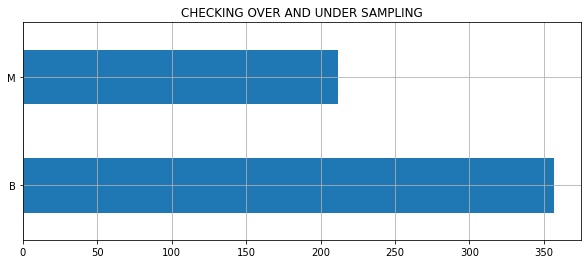

In [13]:
ax=plt.figure(figsize=(10,4))
ax=data.diagnosis.value_counts().plot(kind='barh',grid=True)
plt.title('CHECKING OVER AND UNDER SAMPLING')

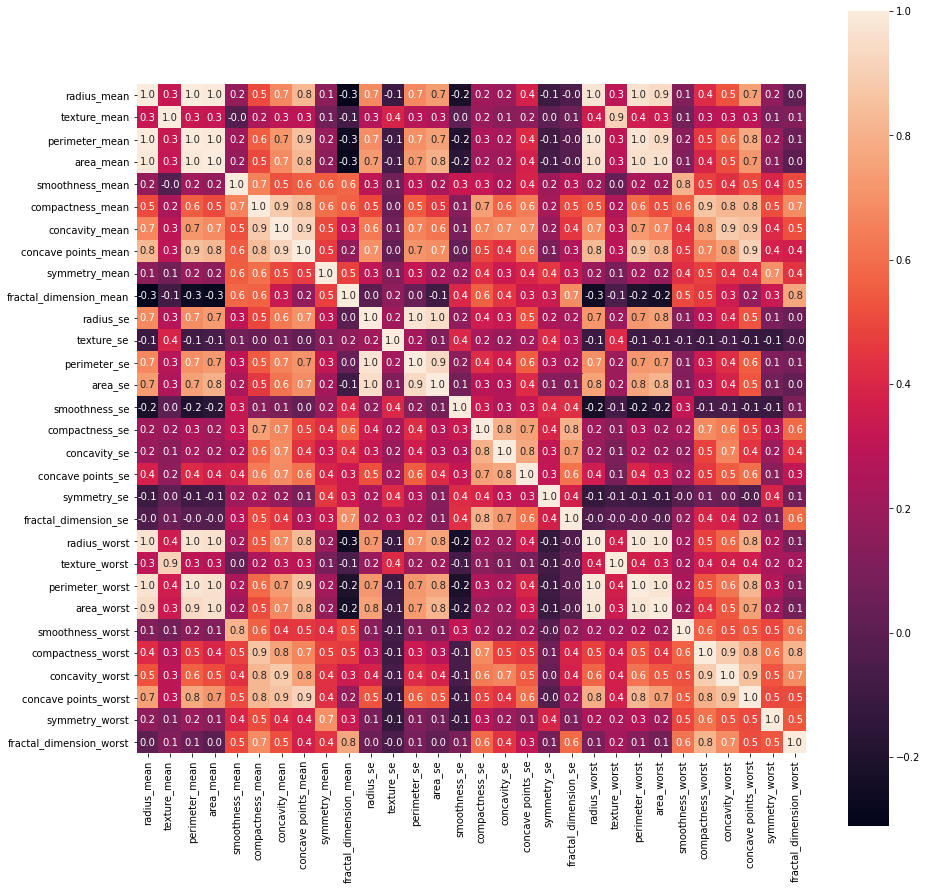

In [91]:
data_correlation=data.corr()
ax=plt.figure(figsize=(15,15))
ax=sns.heatmap(data_correlation,annot=True, fmt='.1f',square=True)

In [14]:
y=data['diagnosis']
X=data.drop('diagnosis', axis=1)

In [93]:
labelencoder=LabelEncoder()
y=labelencoder.fit_transform(y)

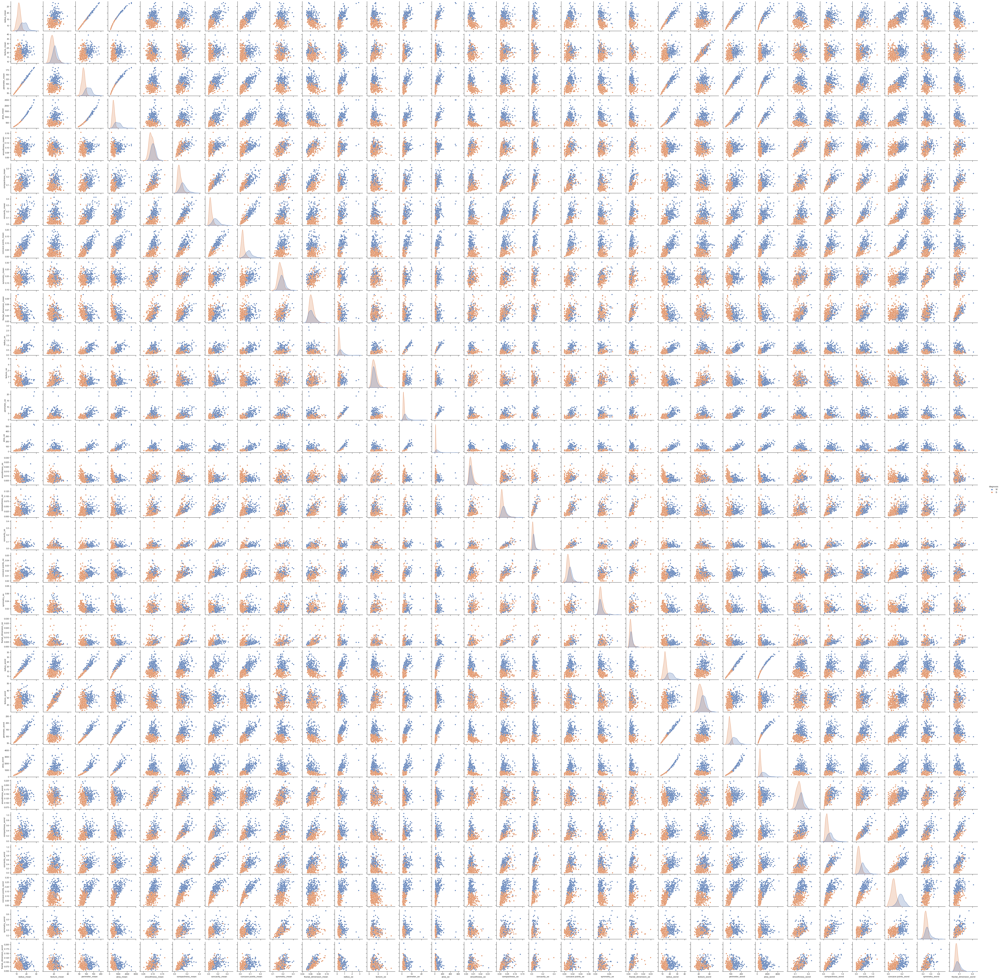

In [15]:
sns.set_theme(style='ticks')
sns.pairplot(data,hue='diagnosis')

In [95]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,stratify=y)

In [96]:
rfc_params=[{'n_estimators':list(np.arange(10)),'max_depth':list(np.arange(5)),'min_samples_split':list(np.arange(5))}]
clf=GridSearchCV(forest,rfc_params,cv =5,scoring='accuracy',refit=True)

In [103]:
#use GridSearchCV to get the best hyperparameters the  use the classifier with the paramaters and plot an importance features graph
start_time=time.time()
clf.fit(X_train,y_train)
elapsed=time.time()-start_time
print('Time for training: '+str(elapsed))
print(clf.best_params_)
print(clf.best_index_)
print(clf.best_score_)

Time for training: 11.401983976364136
{'max_depth': 3, 'min_samples_split': 3, 'n_estimators': 7}
187
0.9516483516483516


In [104]:
forest=RandomForestClassifier(max_depth= 3, min_samples_split=2,n_estimators=7)
forest.fit(X_train,y_train)

RandomForestClassifier(max_depth=3, n_estimators=7)

<AxesSubplot:>

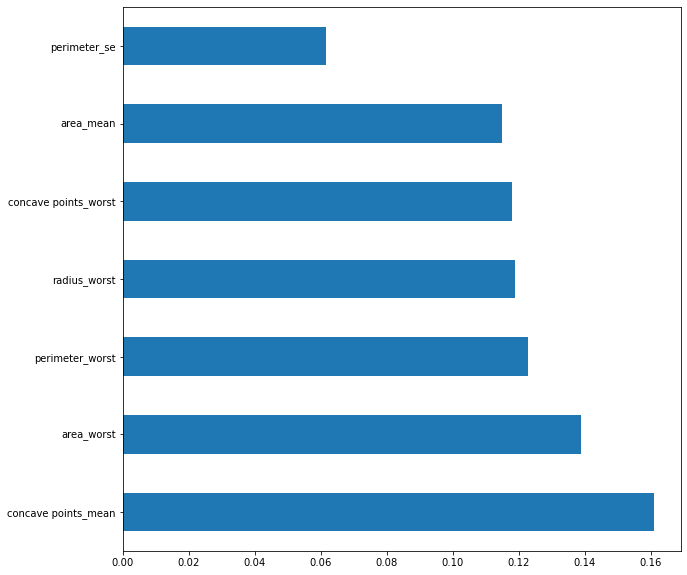

In [105]:
# You cannont plot feature importances if  you used a standarderscaler because the df is turned into a numpy array or even when you used a gridsearchCV because the gridsearchcv has no feature importance method
plt.figure(figsize=(10,10))
feature_importance=pd.Series(forest.feature_importances_,index=X_train.columns)
feature_importance.nlargest(7).plot(kind='barh')

In [109]:
y_pred=forest.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[67  5]
 [ 4 38]]
0.9210526315789473
              precision    recall  f1-score   support

           0       0.94      0.93      0.94        72
           1       0.88      0.90      0.89        42

    accuracy                           0.92       114
   macro avg       0.91      0.92      0.92       114
weighted avg       0.92      0.92      0.92       114

